# Resnet50 with multiple loss on softmax and trplet loss Implement

## 1. Dependencies Imported

In [1]:
import torch
import torchvision
from torch import nn
from torch.nn import init
from torchvision import models
from torch.utils import data
from torch.autograd import Variable

import glob
from PIL import Image
import pandas as pd
import random

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

### 1.1 Visualization

In [2]:
is_ipython = "inline" in matplotlib.get_backend()
if is_ipython:
    from IPython import display

plt.ion()

In [3]:
def draw(x, y):
    plt.figure()
    plt.plot(x, y)
    
    if is_ipython:
        display.clear_output(wait=True)
        display.display(plt.gcf())

## 2. Dataset Implement

In [4]:
class BlinessSet(data.Dataset):
    def __init__(self, root_path, tranform=None, target_tranform=None, evaluation=False, csv_path=None):
        super(BlinessSet, self).__init__()
        
        self.root_path = root_path if root_path[-1] == '/' else root_path + '/' 
        self.csv_path = csv_path
        
        self.tranform = tranform
        self.target_tranform = target_tranform
        self.evaluation = evaluation
        
        if not self.evaluation:
            self.csv_path = csv_path
            self.csv_process()
        else:
            if self.csv_path is None:
                self.file_list = glob.glob(self.root_path + "*.png")
            else:
                self.data_collection = pd.read_csv(self.csv_path)
        
    def csv_process(self):
        self.data_collection = pd.read_csv(self.csv_path)
        
        self.classes = {}
        
        for tmp_class in self.data_collection["diagnosis"].unique():
            tmp_ = list(self.data_collection.loc[self.data_collection["diagnosis"] == tmp_class].index)
            random.shuffle(tmp_)
            self.classes[tmp_class] = tmp_
            
        self.class_number = len(self.classes.keys())
        
    def __getitem__(self, index):
        if self.csv_path is not None:
            if not self.evaluation:
                tmp_key = (index - index % 3) % self.class_number

                if index % 3 == 0:
                    tmp_index = self.classes[tmp_key][index // self.class_number % 1085]
                elif index % 3 == 1:
                    tmp_index = random.choice(self.classes[tmp_key])
                elif index % 3 == 2:
                    tmp_ = list(self.classes.keys())
                    tmp_.remove(tmp_key)
                    tmp_index = random.choice(self.classes[random.choice(tmp_)])
            else:
                tmp_index = index
            
            tmp_data = self.data_collection.loc[tmp_index]

            image_name = tmp_data["id_code"]
            image_label = tmp_data["diagnosis"]
            
            image_path =self.root_path + image_name + ".png"
        else:
            image_path = self.file_list[index]
        
        
        image = Image.open(image_path).convert("RGB")
        
        if self.tranform is not None:
            image = self.tranform(image)
            
        if self.evaluation:
            if self.csv_path is not None:
                return image, image_label
            else:            
                return image, image_path.split("/")[-1].split(".png")[0]
        else:
            if self.target_tranform is not None:
                image_label = self.target_tranform(image_label)
            
            return image, image_label
    
    def __len__(self):
        if not self.evaluation:
            self.csv_process()
            return self.data_collection.shape[0]
        else:
            if self.csv_path is None:
                return len(self.file_list)
            else:
                return self.data_collection.shape[0]

## 3. Model Structure Implement

### 3.1 Parameters Initialization

In [5]:
def weights_init_kaiming(m):
    classname = m.__class__.__name__
    # print(classname)
    if classname.find('Conv') != -1:
        init.kaiming_normal_(m.weight.data, a=0, mode='fan_in') # For old pytorch, you may use kaiming_normal.
    elif classname.find('Linear') != -1:
        init.kaiming_normal_(m.weight.data, a=0, mode='fan_out')
        init.constant_(m.bias.data, 0.0)
    elif classname.find('BatchNorm1d') != -1:
        init.normal_(m.weight.data, 1.0, 0.02)
        init.constant_(m.bias.data, 0.0)

In [6]:
def weights_init_classifier(m):
    classname = m.__class__.__name__
    if classname.find('Linear') != -1:
        init.normal_(m.weight.data, std=0.001)
        init.constant_(m.bias.data, 0.0)

### 3.2 Model Structure

#### 3.2.1 Layer Components

In [7]:
class ClassBlock(nn.Module):
    def __init__(self, input_dim, class_num, droprate, relu=False, bnorm=True, num_bottleneck=512, linear=True, return_f = False):
        super(ClassBlock, self).__init__()
        self.return_f = return_f
        add_block = []
        if linear:
            add_block += [nn.Linear(input_dim, num_bottleneck)]
        else:
            num_bottleneck = input_dim
        if bnorm:
            add_block += [nn.BatchNorm1d(num_bottleneck)]
        if relu:
            add_block += [nn.LeakyReLU(0.1)]
        if droprate>0:
            add_block += [nn.Dropout(p=droprate)]
            
        add_block = nn.Sequential(*add_block)
        add_block.apply(weights_init_kaiming)

        classifier = []
        classifier += [nn.Linear(num_bottleneck, class_num)]
        classifier = nn.Sequential(*classifier)
        classifier.apply(weights_init_classifier)

        self.add_block = add_block
        self.classifier = classifier
        
    def forward(self, x):
        x = self.add_block(x)
        if self.return_f:
            f = x
            x = self.classifier(x)
            return x,f
        else:
            x = self.classifier(x)
            return x

#### 3.2.2 Model Structure

In [8]:
class Blindness(nn.Module):

    def __init__(self, class_num, droprate=0.5, stride=2):
        super(Blindness, self).__init__()
        model_ft = models.resnet50(pretrained=True)
        # avg pooling to global pooling
        if stride == 1:
            model_ft.layer4[0].downsample[0].stride = (1,1)
            model_ft.layer4[0].conv2.stride = (1,1)
        model_ft.avgpool = nn.AdaptiveAvgPool2d((1,1))
        self.model = model_ft
        self.classifier = ClassBlock(2048, class_num, droprate)

    def forward(self, x, train_flag):
        x = self.model.conv1(x)
        x = self.model.bn1(x)
        x = self.model.relu(x)
        x = self.model.maxpool(x)
        x = self.model.layer1(x)
        x = self.model.layer2(x)
        x = self.model.layer3(x)
        x = self.model.layer4(x)
        x = self.model.avgpool(x)
        x = x.view(x.size(0), x.size(1))
        
        if train_flag:
            triplet_feature = torch.clone(x)
        else:
            triplet_feature = None
        
        x = self.classifier(x)
        return x, triplet_feature

## 4. Training Process

### 4.1 CUDA Detection

In [9]:
if torch.cuda.is_available():
    CUDA_USAGE = True
else:
    CUDA_USAGE = False

### 4.2 Data Preprocess

In [10]:
transform_train_list = [
    torchvision.transforms.Resize((256, 256), interpolation=3),
#     torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
]
data_transform = torchvision.transforms.Compose(transform_train_list)

### 4.3 Dataset Implement

In [11]:
img_root_path = "/home/extension/kaggle/APTOS_2019_Blindness_Detection/train_images"
img_csv = "/home/hdd/hdD_Git/kaggle/image_data/classification/aptos_2019_blindness_detection/final.csv"

In [15]:
train_dataset = BlinessSet(img_root_path, data_transform, csv_path=img_csv)
dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=48, shuffle=False, num_workers=8)

### 4.4 Model Defination

In [13]:
model = Blindness(5)
if CUDA_USAGE:
    model = model.cuda()
else:
    pass

### 4.5 Optim Initialization

In [14]:
loss_function_class = torch.nn.CrossEntropyLoss()
loss_function_metric = torch.nn.TripletMarginLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=5e-4)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, [30, 45], gamma=0.1)

### 4.6 Training

In [15]:
EPOCH = 60
ITERATION = 0
ITERATION_LIST = []
LOSS_LIST = []

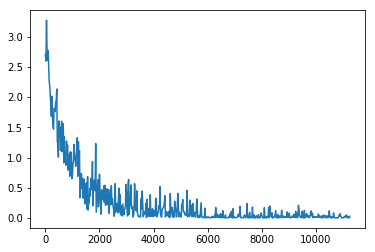

the iteration # is 11260, the loss is 0.012548189


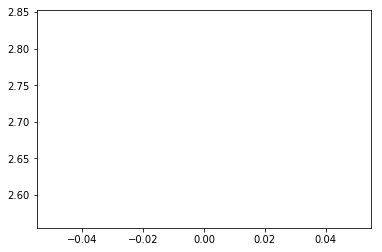

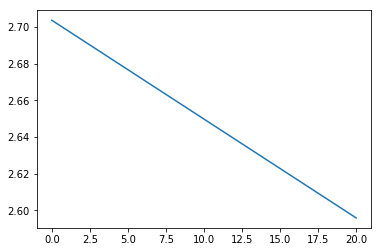

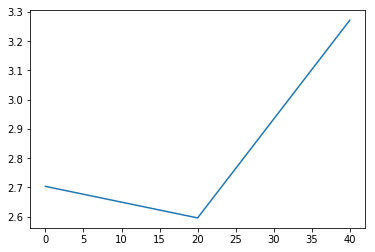

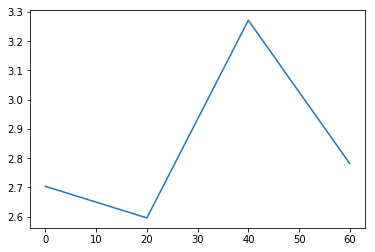

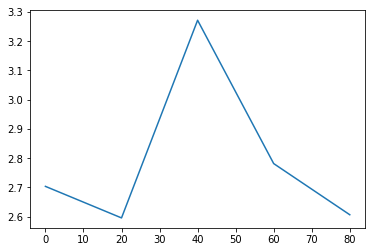

...

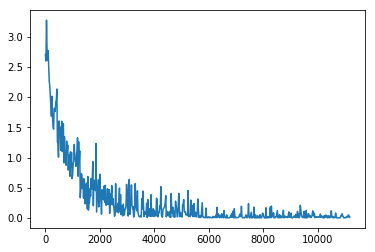

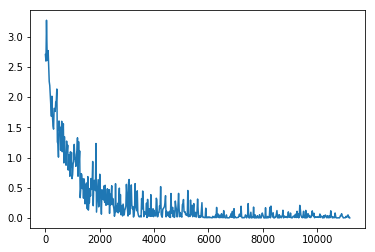

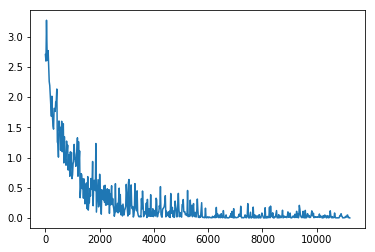

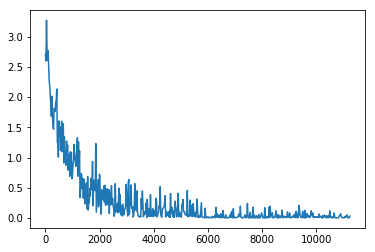

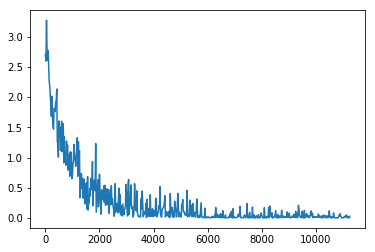

In [16]:
try:
    for tmp_epoch in range(EPOCH):
        for data in dataloader:
            img_data, label = data

            if CUDA_USAGE:
                input_data = Variable(img_data.cuda())
                label = Variable(label.cuda())
            else:
                pass

            optimizer.zero_grad()

            outputs, feature = model(input_data, True)
                        
            anchor_feature = feature[0::3]
            positive_feature = feature[1::3]
            negtive_feature = feature[2::3]
                        
            loss = loss_function_class(outputs, label) + loss_function_metric(anchor_feature, positive_feature, negtive_feature)

            loss.backward()
            optimizer.step()

            if ITERATION % 20 == 0:
                loss = loss.cpu().detach().numpy()
                LOSS_LIST.append(loss)
                ITERATION_LIST.append(ITERATION)

                draw(ITERATION_LIST, LOSS_LIST)
                print("the iteration # is %s, the loss is %s" %(ITERATION, loss))

            ITERATION += 1

        if tmp_epoch % 5 == 0 and tmp_epoch != 0:
            torch.save(model.state_dict(), "./models/" + str(tmp_epoch) + ".pth")

        scheduler.step()
except KeyboardInterrupt:
    torch.save(model.state_dict(), "./models/interrupt_" + str(ITERATION) + ".pth")

## 5. Evaluation

### 5.1 Load weights

In [10]:
weight_path = "/home/hdd/hdD_Git/kaggle/image_data/classification/aptos_2019_blindness_detection/models/triplet_loss/55.pth"

In [11]:
model = Blindness(5)
if CUDA_USAGE:
    model = model.cuda()
else:
    pass

In [12]:
model.load_state_dict(torch.load(weight_path))
model.eval()

Blindness(
  (model): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace)
        (downsample): Sequential(
          (0): Conv2

### 5.2 Dataset

#### 5.2.1 Test Dataset

In [13]:
test_dataset = "/home/extension/kaggle/APTOS_2019_Blindness_Detection/test_images"

In [14]:
transform_test_list = [
    torchvision.transforms.Resize((256, 256), interpolation=3),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
]
data_transform = torchvision.transforms.Compose(transform_test_list)

In [15]:
test_dataset = BlinessSet(test_dataset, data_transform, evaluation=True)
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=8)

#### 5.2.2 Train Dataset

In [16]:
train_dataset = "/home/extension/kaggle/APTOS_2019_Blindness_Detection/train_images"
train_csv = "/home/hdd/hdD_Git/kaggle/image_data/classification/aptos_2019_blindness_detection/final.csv"

In [17]:
train_dataset = BlinessSet(train_dataset, data_transform, evaluation=True, csv_path=train_csv)
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=False, num_workers=8)

### 5.3 Extract features

#### 5.3.1 Test Feature

In [18]:
test_feature_tensor = None
test_feature_name = []
for tmp_data in test_dataloader:
    img_data, name = tmp_data
    
    if CUDA_USAGE:
        input_data = Variable(img_data.cuda())
    else:
        pass
    
    outputs, feature = model(input_data, True)
    
    feature = feature.detach().cpu()
    
    if test_feature_tensor is None:
        test_feature_tensor = feature
    else:
        test_feature_tensor = torch.cat((test_feature_tensor, feature))
    
    test_feature_name.extend(list(name))
    
    torch.cuda.empty_cache()

#### 5.3.2 Train Feature

In [ ]:
train_feature_tensor = None
train_feature_name = []
for tmp_data in train_dataloader:
    img_data, name = tmp_data
    
    if CUDA_USAGE:
        input_data = Variable(img_data.cuda())
    else:
        pass
    
    outputs, feature = model(input_data, True)
    
    feature = feature.detach().cpu()
    
    if train_feature_tensor is None:
        train_feature_tensor = feature
    else:
        train_feature_tensor = torch.cat((train_feature_tensor, feature))
        
    train_feature_name.extend(list(name))
    torch.cuda.empty_cache()